# Forecasting Victory: 2024 League of Legends Worlds Matches Predictions

**Name(s)**: Jiahao Cheng

**Website Link**: https://cjhjw.github.io/EECS398-Final-Project/

In [245]:
import pandas as pd
import numpy as np

import plotly.express as px
pd.options.plotting.backend = 'plotly'

from lec_utils import * # Feel free to uncomment and use this. It'll make your plotly graphs look like ours in lecture!

## Step 1: Introduction

In [246]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
data = pd.read_csv('2024_LoL_esports_match_data_from_OraclesElixir.csv')
data.head(12)

,gameid,datacompleteness,url,league,year,split,playoffs,date,game,patch,participantid,side,position,playername,playerid,teamname,teamid,champion,ban1,ban2,ban3,ban4,ban5,pick1,pick2,pick3,pick4,pick5,gamelength,result,kills,deaths,assists,teamkills,teamdeaths,doublekills,triplekills,quadrakills,pentakills,firstblood,firstbloodkill,firstbloodassist,firstbloodvictim,team kpm,ckpm,firstdragon,dragons,opp_dragons,elementaldrakes,opp_elementaldrakes,infernals,mountains,clouds,oceans,chemtechs,hextechs,dragons (type unknown),elders,opp_elders,firstherald,heralds,opp_heralds,void_grubs,opp_void_grubs,firstbaron,barons,opp_barons,firsttower,towers,opp_towers,firstmidtower,firsttothreetowers,turretplates,opp_turretplates,inhibitors,opp_inhibitors,damagetochampions,dpm,damageshare,damagetakenperminute,damagemitigatedperminute,wardsplaced,wpm,wardskilled,wcpm,controlwardsbought,visionscore,vspm,totalgold,earnedgold,earned gpm,earnedgoldshare,goldspent,gspd,gpr,total cs,minionkills,monsterkills,monsterkillsownjungle,monsterkillsenemyjungle,cspm,goldat10,xpat10,csat10,opp_goldat10,opp_xpat10,opp_csat10,golddiffat10,xpdiffat10,csdiffat10,killsat10,assistsat10,deathsat10,opp_killsat10,opp_assistsat10,opp_deathsat10,goldat15,xpat15,csat15,opp_goldat15,opp_xpat15,opp_csat15,golddiffat15,xpdiffat15,csdiffat15,killsat15,assistsat15,deathsat15,opp_killsat15,opp_assistsat15,opp_deathsat15,goldat20,xpat20,csat20,opp_goldat20,opp_xpat20,opp_csat20,golddiffat20,xpdiffat20,csdiffat20,killsat20,assistsat20,deathsat20,opp_killsat20,opp_assistsat20,opp_deathsat20,goldat25,xpat25,csat25,opp_goldat25,opp_xpat25,opp_csat25,golddiffat25,xpdiffat25,csdiffat25,killsat25,assistsat25,deathsat25,opp_killsat25,opp_assistsat25,opp_deathsat25
0,10660-10660_game_1,partial,https://lpl.qq.com/es/stats.shtml?bmid=10660,DCup,2023,NaN,0,2024-01-01 05:13:15,1,13.24,1,Blue,top,Zika,oe:player:65ed20b21e2993fb00dbd21a2fd991b,LNG Esports,oe:team:a9145b7711873f53e610fbba0493484,Aatrox,Akali,Nocturne,K'Sante,Lee Sin,Wukong,NaN,NaN,NaN,NaN,NaN,1886,0,1,3,1,3,16,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.10,0.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7092,225.62,0.17,564.15,NaN,14,0.45,4,0.13,5,24,0.76,11083,6960,221.42,0.24,10784,NaN,NaN,279.0,256.0,23,16.0,0.0,8.88,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,10660-10660_game_1,partial,https://lpl.qq.com/es/stats.shtml?bmid=10660,DCup,2023,NaN,0,2024-01-01 05:13:15,1,13.24,2,Blue,jng,Weiwei,oe:player:57da8dfcfbdb4e5b019fe93003db1c4,LNG Esports,oe:team:a9145b7711873f53e610fbba0493484,Maokai,Akali,Nocturne,K'Sante,Lee Sin,Wukong,NaN,NaN,NaN,NaN,NaN,1886,0,0,4,3,3,16,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.10,0.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7361,234.18,0.18,847.48,NaN,10,0.32,12,0.38,10,39,1.24,8636,4513,143.57,0.15,8840,NaN,NaN,153.0,14.0,139,111.0,3.0,4.87,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,10660-10660_game_1,partial,https://lpl.qq.com/es/stats.shtml?bmid=10660,DCup,2023,NaN,0,2024-01-01 05:13:15,1,13.24,3,Blue,mid,Scout,oe:player:71e79ef80600d398d90cfebe3b0b758,LNG Esports,oe:team:a9145b7711873f53e610fbba0493484,Orianna,Akali,Nocturne,K'Sante,Lee Sin,Wukong,NaN,NaN,NaN,NaN,NaN,1886,0,0,2,0,3,16,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.10,0.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10005,318.29,0.24,432.22,NaN,4,0.13,8,0.25,2,31,0.99,10743,6620,210.60,0.23,10594,NaN,NaN,270.0,269.0,1,1.0,0.0,8.59

In [247]:
data.shape

(117576, 161)

In [248]:
data.iloc[10:12]

,gameid,datacompleteness,url,league,year,split,playoffs,date,game,patch,participantid,side,position,playername,playerid,teamname,teamid,champion,ban1,ban2,ban3,ban4,ban5,pick1,pick2,pick3,pick4,pick5,gamelength,result,kills,deaths,assists,teamkills,teamdeaths,doublekills,triplekills,quadrakills,pentakills,firstblood,firstbloodkill,firstbloodassist,firstbloodvictim,team kpm,ckpm,firstdragon,dragons,opp_dragons,elementaldrakes,opp_elementaldrakes,infernals,mountains,clouds,oceans,chemtechs,hextechs,dragons (type unknown),elders,opp_elders,firstherald,heralds,opp_heralds,void_grubs,opp_void_grubs,firstbaron,barons,opp_barons,firsttower,towers,opp_towers,firstmidtower,firsttothreetowers,turretplates,opp_turretplates,inhibitors,opp_inhibitors,damagetochampions,dpm,damageshare,damagetakenperminute,damagemitigatedperminute,wardsplaced,wpm,wardskilled,wcpm,controlwardsbought,visionscore,vspm,totalgold,earnedgold,earned gpm,earnedgoldshare,goldspent,gspd,gpr,total cs,minionkills,monsterkills,monsterkillsownjungle,monsterkillsenemyjungle,cspm,goldat10,xpat10,csat10,opp_goldat10,opp_xpat10,opp_csat10,golddiffat10,xpdiffat10,csdiffat10,killsat10,assistsat10,deathsat10,opp_killsat10,opp_assistsat10,opp_deathsat10,goldat15,xpat15,csat15,opp_goldat15,opp_xpat15,opp_csat15,golddiffat15,xpdiffat15,csdiffat15,killsat15,assistsat15,deathsat15,opp_killsat15,opp_assistsat15,opp_deathsat15,goldat20,xpat20,csat20,opp_goldat20,opp_xpat20,opp_csat20,golddiffat20,xpdiffat20,csdiffat20,killsat20,assistsat20,deathsat20,opp_killsat20,opp_assistsat20,opp_deathsat20,goldat25,xpat25,csat25,opp_goldat25,opp_xpat25,opp_csat25,golddiffat25,xpdiffat25,csdiffat25,killsat25,assistsat25,deathsat25,opp_killsat25,opp_assistsat25,opp_deathsat25
10,10660-10660_game_1,partial,https://lpl.qq.com/es/stats.shtml?bmid=10660,DCup,2023,NaN,0,2024-01-01 05:13:15,1,13.24,100,Blue,team,NaN,NaN,LNG Esports,oe:team:a9145b7711873f53e610fbba0493484,NaN,Akali,Nocturne,K'Sante,Lee Sin,Wukong,Kalista,Senna,Orianna,Maokai,Aatrox,1886,0,3,16,7,3,16,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.10,0.6,NaN,2.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,2.0,NaN,2.0,9.0,NaN,NaN,NaN,NaN,0.0,1.0,41801,1329.83,NaN,2574.97,NaN,97,3.09,59,1.88,33,250,7.95,49907,29292,931.88,NaN,47512,-0.13,NaN,NaN,NaN,167,127.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11,10660-10660_game_1,partial,https://lpl.qq.com/es/stats.shtml?bmid=10660,DCup,2023,NaN,0,2024-01-01 05:13:15,1,13.24,200,Red,team,NaN,NaN,Rare Atom,oe:team:8516ca63facc91286d6c00212ca945e,NaN,Poppy,Ashe,Neeko,Vi,Jarvan IV,Renata Glasc,Varus,LeBlanc,Rell,Rumble,1886,1,16,3,43,16,3,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,0.51,0.6,NaN,3.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,NaN,9.0,2.0,NaN,NaN,NaN,NaN,1.0,0.0,56942,1811.52,NaN,1917.04,NaN,122,3.88,49,1.56,56,277,8.81,61737,41122,1308.23,NaN,54207,0.13,NaN,NaN,NaN,213,121.0,29.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Step 2: Data Cleaning and Exploratory Data Analysis

### 2.1 Extract team data and target columns

In [249]:
target_columns = ['result', 'side', 'firstblood', 'firstdragon', 'firstbaron', 'firsttower',
                  'firstmidtower', 'firsttothreetowers', 'gamelength', 'golddiffat10', 'golddiffat15', 
                  'golddiffat20', 'xpdiffat10', 'xpdiffat15', 'xpdiffat20']
data = data.loc[data['position'] == 'team', target_columns].reset_index().drop('index', axis=1)
data.head()

,result,side,firstblood,firstdragon,firstbaron,firsttower,firstmidtower,firsttothreetowers,gamelength,golddiffat10,golddiffat15,golddiffat20,xpdiffat10,xpdiffat15,xpdiffat20
0,0,Blue,0.0,NaN,NaN,NaN,NaN,NaN,1886,NaN,NaN,NaN,NaN,NaN,NaN
1,1,Red,1.0,NaN,NaN,NaN,NaN,NaN,1886,NaN,NaN,NaN,NaN,NaN,NaN
2,0,Blue,0.0,NaN,NaN,NaN,NaN,NaN,1911,NaN,NaN,NaN,NaN,NaN,NaN
3,1,Red,1.0,NaN,NaN,NaN,NaN,NaN,1911,NaN,NaN,NaN,NaN,NaN,NaN
4,1,Blue,1.0,NaN,NaN,NaN,NaN,NaN,1324,NaN,NaN,NaN,NaN,NaN,NaN


In [250]:
data.shape

(19596, 15)

### 2.2 Check and modify NaN

In [251]:
data.isna().sum()

result                   0
side                     0
firstblood               0
firstdragon           2782
firstbaron            2782
firsttower            2782
firstmidtower         2784
firsttothreetowers    2782
gamelength               0
golddiffat10          2784
golddiffat15          2786
golddiffat20          2822
xpdiffat10            2784
xpdiffat15            2786
xpdiffat20            2822
dtype: int64

In [252]:
need_drop = ['firsttower', 'firstmidtower', 'firsttothreetowers', 'golddiffat10', 'golddiffat15', 'golddiffat20',
             'xpdiffat10', 'xpdiffat15', 'xpdiffat20']
data = data.dropna(subset=need_drop)
data.isna().sum()

result                0
side                  0
firstblood            0
firstdragon           0
firstbaron            0
firsttower            0
firstmidtower         0
firsttothreetowers    0
gamelength            0
golddiffat10          0
golddiffat15          0
golddiffat20          0
xpdiffat10            0
xpdiffat15            0
xpdiffat20            0
dtype: int64

In [253]:
data.shape

(16774, 15)

### 2.3 Categorize Gamelength

In [254]:
data['gamelength'].min()

1143

In [255]:
data['gamelength'].max()

3482

In [256]:
fig = px.histogram(
    data,
    x='gamelength',
    nbins=150,
    title='Game Count by Game Duration (seconds)',
    marginal='box',
    color_discrete_sequence=['#AB63FA'],
    width=700,
    height=400
)
fig.update_layout(
    xaxis_title='Game Duration (seconds)',
    yaxis_title='Number of Games'
)

fig.show()

In [257]:
fig.write_html("gamelength_hist.html")

In [258]:
gametime = ['<=25(mins)', '25-30(mins)', '30-35(mins)', '35-40(mins)', '>=40(mins)']
def group_time(time):
    if time <= 1499:
        return gametime[0]
    elif 1500 <= time <= 1799:
        return gametime[1]
    elif 1800 <= time <= 2099:
        return gametime[2]
    elif 2100 <= time <= 2399:
        return gametime[3]
    else:
        return gametime[4]

data = data.assign(time_label = data['gamelength'].apply(group_time)).drop('gamelength', axis=1)

In [259]:
data['time_label'].value_counts()

time_label
30-35(mins)    5522
25-30(mins)    5348
35-40(mins)    2714
<=25(mins)     1786
>=40(mins)     1404
Name: count, dtype: int64

In [260]:
data['time_label'].value_counts().reindex(gametime)

time_label
<=25(mins)     1786
25-30(mins)    5348
30-35(mins)    5522
35-40(mins)    2714
>=40(mins)     1404
Name: count, dtype: int64

In [261]:
counts = data['time_label'].value_counts().reindex(gametime).reset_index()

fig = px.bar(
    counts,
    x='time_label',
    y='count',
    title='Game Count by Game Duration (minutes)',
    color_discrete_sequence=['#AB63FA'],
    width=700,
    height=400
)
fig.update_layout(
    xaxis_title='Game Duration (minutes)',
    yaxis_title='Number of Games'
)
fig.show()

In [262]:
fig.write_html("gameduration_hist.html")

### 2.4 Recategorize result as win

In [263]:
data = data.assign(win = data['result'].apply(lambda x: True if x == 1 else False)).drop('result', axis=1)

In [264]:
from tabulate import tabulate
print(data.head().to_markdown())

|    | side   |   firstblood |   firstdragon |   firstbaron |   firsttower |   firstmidtower |   firsttothreetowers |   golddiffat10 |   golddiffat15 |   golddiffat20 |   xpdiffat10 |   xpdiffat15 |   xpdiffat20 | time_label   | win   |
|---:|:-------|-------------:|--------------:|-------------:|-------------:|----------------:|---------------------:|---------------:|---------------:|---------------:|-------------:|-------------:|-------------:|:-------------|:------|
| 30 | Blue   |            0 |             1 |            1 |            1 |               1 |                    1 |           1364 |           2293 |           4248 |          557 |          949 |         2138 | <=25(mins)   | True  |
| 31 | Red    |            1 |             0 |            0 |            0 |               0 |                    0 |          -1364 |          -2293 |          -4248 |         -557 |         -949 |        -2138 | <=25(mins)   | False |
| 32 | Blue   |            0 |             0 |      

In [265]:
data.shape

(16774, 15)

### 2.5 golddiffat10 distribution

In [266]:
df = data.loc[data['side'] == 'Red']
fig = px.histogram(
    df,
    x='golddiffat10',
    nbins=150,
    title='Team Count by Gold Difference at 10 minutes',
    marginal='box',
    color_discrete_sequence=['#FF4040'],
    width=700,
    height=400
)
fig.update_layout(
    xaxis_title='Gold Difference at 10 minutes',
    yaxis_title='Number of Teams'
)
lower, upper = df['golddiffat10'].quantile([0.025, 0.975])
fig.add_vline(
    x=lower,
    line_dash='dash',
    line_color='red',
    line_width=2,
    annotation_text=f'2.5% ({lower:.0f})',  
    annotation_position='top left',
    annotation_font_color='black',
    annotation_bgcolor='white'
)

fig.add_vline(
    x=upper,
    line_dash='dash',
    line_color='red',
    line_width=2,
    annotation_text=f'97.5% ({upper:.0f})',
    annotation_position='top right',
    annotation_font_color='black',
    annotation_bgcolor='white'
)

fig.show()

In [267]:
df = data.loc[data['side'] == 'Blue']
fig = px.histogram(
    df,
    x='golddiffat10',
    nbins=150,
    title='Team Count by Gold Difference at 10 minutes',
    marginal='box',
    color_discrete_sequence=['#1E90FF'],
    width=700,
    height=400
)
fig.update_layout(
    xaxis_title='Gold Difference at 10 minutes',
    yaxis_title='Number of Teams'
)
lower, upper = df['golddiffat10'].quantile([0.025, 0.975])

fig.add_vline(
    x=lower,
    line_dash='dash',
    line_color='#1E90FF',
    line_width=2,
    annotation_text=f'2.5% ({lower:.0f})', 
    annotation_position='top left',
    annotation_font_color='black',
    annotation_bgcolor='white'
)


fig.add_vline(
    x=upper,
    line_dash='dash',
    line_color='#1E90FF',
    line_width=2,
    annotation_text=f'97.5% ({upper:.0f})',
    annotation_position='top right',
    annotation_font_color='black',
    annotation_bgcolor='white'
)

fig.show()

In [268]:
df = data.loc[data['side'] == 'Red']
fig = px.histogram(
    df,
    x='xpdiffat10',
    nbins=150,
    title='Team Count by XP Difference at 10 minutes',
    marginal='box',
    color_discrete_sequence=['#CE2029'],
    width=700,
    height=400
)
fig.update_layout(
    xaxis_title='XP Difference at 10 minutes',
    yaxis_title='Number of Teams'
)
lower, upper = df['xpdiffat10'].quantile([0.025, 0.975])
fig.add_vline(
    x=lower,
    line_dash='dash',
    line_color='#CE2029',
    line_width=2,
    annotation_text=f'2.5% ({lower:.0f})',  
    annotation_position='top left',
    annotation_font_color='black',
    annotation_bgcolor='white'
)

fig.add_vline(
    x=upper,
    line_dash='dash',
    line_color='#CE2029',
    line_width=2,
    annotation_text=f'97.5% ({upper:.0f})',
    annotation_position='top right',
    annotation_font_color='black',
    annotation_bgcolor='white'
)

fig.show()

In [269]:
fig.write_html("xp10_red.html")

In [270]:
df = data.loc[data['side'] == 'Blue']
fig = px.histogram(
    df,
    x='xpdiffat10',
    nbins=150,
    title='Team Count by XP Difference at 10 minutes',
    marginal='box',
    color_discrete_sequence=['#4682B4'],
    width=700,
    height=400
)
fig.update_layout(
    xaxis_title='XP Difference at 10 minutes',
    yaxis_title='Number of Teams'
)
lower, upper = df['xpdiffat10'].quantile([0.025, 0.975])
fig.add_vline(
    x=lower,
    line_dash='dash',
    line_color='#4682B4',
    line_width=2,
    annotation_text=f'2.5% ({lower:.0f})',  
    annotation_position='top left',
    annotation_font_color='black',
    annotation_bgcolor='white'
)

fig.add_vline(
    x=upper,
    line_dash='dash',
    line_color='#4682B4',
    line_width=2,
    annotation_text=f'97.5% ({upper:.0f})',
    annotation_position='top right',
    annotation_font_color='black',
    annotation_bgcolor='white'
)

fig.show()

In [271]:
fig.write_html("xp10_blue.html")

### 2.6 First* Info Explore

In [272]:
target_columns = ['firstblood', 'firstdragon', 'firstbaron', 'firsttower',
                  'firstmidtower', 'firsttothreetowers']
data[target_columns] = data[target_columns] == 1

In [273]:
fig = px.bar(
    data.groupby(['side', 'firstblood'])['win'].mean().reset_index(),
    x='firstblood',
    y='win',
    color='side',
    barmode='group',
    color_discrete_map={'Blue': 'steelblue', 'Red': 'crimson'},
    title='Win Rate by Side and First Blood',
    width=700,
    height=400
)

fig.update_layout(
    xaxis_title='First Blood',
    yaxis_title='Average Win Rate'
)

fig.show()

In [274]:
fig.write_html("win_rate_blood.html")

In [275]:
fig = px.bar(
    data.groupby(['side', 'firstdragon'])['win'].mean().reset_index(),
    x='firstdragon',
    y='win',
    color='side',
    barmode='group',
    color_discrete_map={'Blue': 'steelblue', 'Red': 'crimson'},
    title='Win Rate by Side and First Dragon',
    width=700,
    height=400
)

fig.update_layout(
    xaxis_title='First Dragon',
    yaxis_title='Average Win Rate'
)

fig.show()

In [276]:
fig.write_html("win_rate_dragon.html")

In [277]:
fig = px.bar(
    data.groupby(['side', 'firstbaron'])['win'].mean().reset_index(),
    x='firstbaron',
    y='win',
    color='side',
    barmode='group',
    color_discrete_map={'Blue': 'steelblue', 'Red': 'crimson'},
    title='Win Rate by Side and First Baron',
    width=700,
    height=400
)

fig.update_layout(
    xaxis_title='First Baron',
    yaxis_title='Average Win Rate'
)

fig.show()

In [278]:
fig = px.bar(
    data.groupby(['side', 'firsttower'])['win'].mean().reset_index(),
    x='firsttower',
    y='win',
    color='side',
    barmode='group',
    color_discrete_map={'Blue': 'steelblue', 'Red': 'crimson'},
    title='Win Rate by Side and First Tower',
    width=700,
    height=400
)

fig.update_layout(
    xaxis_title='First Tower',
    yaxis_title='Average Win Rate'
)

fig.show()

In [279]:
fig = px.bar(
    data.groupby(['side', 'firstmidtower'])['win'].mean().reset_index(),
    x='firstmidtower',
    y='win',
    color='side',
    barmode='group',
    color_discrete_map={'Blue': 'steelblue', 'Red': 'crimson'},
    title='Win Rate by Side and First Mid Tower',
    width=700,
    height=400
)

fig.update_layout(
    xaxis_title='First Mid Tower',
    yaxis_title='Average Win Rate'
)

fig.show()

In [280]:
fig = px.bar(
    data.groupby(['side', 'firsttothreetowers'])['win'].mean().reset_index(),
    x='firsttothreetowers',
    y='win',
    color='side',
    barmode='group',
    color_discrete_map={'Blue': 'steelblue', 'Red': 'crimson'},
    title='Win Rate by Side and First Three Tower',
    width=700,
    height=400
)

fig.update_layout(
    xaxis_title='First Three Tower',
    yaxis_title='Average Win Rate'
)

fig.show()

In [281]:
df1 = (
    data
    .groupby(['side', 'firsttothreetowers'])
    ['win']
    .mean()
    .reset_index()
)
df2 = (
    data
    .groupby(['side', 'firstmidtower'])
    ['win']
    .mean()
    .reset_index()
)
df3 = (
    data
    .groupby(['side', 'firsttower'])
    ['win']
    .mean()
    .reset_index()
)
df4 = (
    data
    .groupby(['side', 'firstdragon'])
    ['win']
    .mean()
    .reset_index()
)
df5 = (
    data
    .groupby(['side', 'firstbaron'])
    ['win']
    .mean()
    .reset_index()
)
df6 = (
    data
    .groupby(['side', 'firstblood'])
    ['win']
    .mean()
    .reset_index()
)

In [282]:
df1 = df1.rename(columns={'firsttothreetowers': 'First Info Result'})
df1['First Info Detail'] = 'First to Three Towers'

df2 = df2.rename(columns={'firstmidtower': 'First Info Result'})
df2['First Info Detail'] = 'First Mid Tower'

df3 = df3.rename(columns={'firsttower': 'First Info Result'})
df3['First Info Detail'] = 'First Tower'

df4 = df4.rename(columns={'firstdragon': 'First Info Result'})
df4['First Info Detail'] = 'First Dragon'

df5 = df5.rename(columns={'firstbaron': 'First Info Result'})
df5['First Info Detail'] = 'First Baron'

df6 = df6.rename(columns={'firstblood': 'First Info Result'})
df6['First Info Detail'] = 'First Blood'

In [283]:
df_all = pd.concat([df1, df2, df3, df4, df5, df6], ignore_index=True)
df_all['Side_First_Info'] = df_all['side'] + ' - ' + df_all['First Info Result'].astype(str)
df_all

,side,First Info Result,win,First Info Detail,Side_First_Info
0,Blue,False,0.21,First to Three Towers,Blue - False
1,Blue,True,0.76,First to Three Towers,Blue - True
2,Red,False,0.24,First to Three Towers,Red - False
3,Red,True,0.79,First to Three Towers,Red - True
4,Blue,False,0.26,First Mid Tower,Blue - False
5,Blue,True,0.72,First Mid Tower,Blue - True
6,Red,False,0.28,First Mid Tower,Red - False
7,Red,True,0.74,First Mid Tower,Red - True
8,Blue,False,0.33,First Tower,Blue - False
9,Blue,True,0.69,First Tower,Blue - True


In [284]:
color_map = {
    'Blue - False': '#4B8BBE',   
    'Blue - True': '#306998',   
    'Red - False': '#FF7F7F',  
    'Red - True': '#D62728'
}

In [285]:
desired_order = ['Red - False', 'Blue - False', 'Red - True', 'Blue - True']
fig = df_all.plot(kind='bar',
            x='First Info Detail',
            y='win',
            color='Side_First_Info',
            barmode='group',
            category_orders={
        'First Info Detail': [
            'First Blood', 'First Dragon', 'First Tower',
            'First Mid Tower', 'First to Three Towers', 'First Baron'
        ],
        'Side_First_Info': desired_order
    },            color_discrete_map=color_map,
            title='Win Rate by Side and Tower'
)
fig.update_layout(
    width=1000,
    height=400
)
fig

In [286]:
fig.write_html("win_rate_side_tower.html")

### 2.7 Explore side

In [287]:
target_columns = ['firstblood', 'firstdragon', 'firstbaron', 'firsttower',
                  'firstmidtower', 'firsttothreetowers', 'golddiffat10', 'golddiffat15', 
                  'golddiffat20', 'xpdiffat10', 'xpdiffat15', 'xpdiffat20', 'win']
df = data.groupby('side')[target_columns].mean()
df

,firstblood,firstdragon,firstbaron,firsttower,firstmidtower,firsttothreetowers,golddiffat10,golddiffat15,golddiffat20,xpdiffat10,xpdiffat15,xpdiffat20,win
side,,,,,,,,,,,,,
Blue,0.52,0.38,0.50,0.55,0.57,0.57,144.92,331.16,523.68,66.9,94.46,95.87,0.53
Red,0.48,0.61,0.46,0.45,0.43,0.43,-144.92,-331.16,-523.68,-66.9,-94.46,-95.87,0.47


In [288]:
from tabulate import tabulate
print(df.to_markdown())

| side   |   firstblood |   firstdragon |   firstbaron |   firsttower |   firstmidtower |   firsttothreetowers |   golddiffat10 |   golddiffat15 |   golddiffat20 |   xpdiffat10 |   xpdiffat15 |   xpdiffat20 |      win |
|:-------|-------------:|--------------:|-------------:|-------------:|----------------:|---------------------:|---------------:|---------------:|---------------:|-------------:|-------------:|-------------:|---------:|
| Blue   |     0.516275 |      0.384643 |     0.501967 |     0.548706 |        0.572314 |             0.571837 |        144.923 |        331.158 |        523.683 |      66.8972 |      94.4559 |       95.871 | 0.527483 |
| Red    |     0.483725 |      0.61488  |     0.456421 |     0.451294 |        0.427686 |             0.428163 |       -144.923 |       -331.158 |       -523.683 |     -66.8972 |     -94.4559 |      -95.871 | 0.472517 |


In [289]:
df = data.pivot_table(index='side',
                 columns='time_label',
                 values='win',
                 aggfunc='mean').reindex(columns=gametime)
df

time_label,<=25(mins),25-30(mins),30-35(mins),35-40(mins),>=40(mins)
side,,,,,
Blue,0.6,0.52,0.52,0.51,0.53
Red,0.4,0.48,0.48,0.49,0.47


In [290]:
from tabulate import tabulate
print(df.to_markdown())

| side   |   <=25(mins) |   25-30(mins) |   30-35(mins) |   35-40(mins) |   >=40(mins) |
|:-------|-------------:|--------------:|--------------:|--------------:|-------------:|
| Blue   |     0.601344 |      0.522438 |      0.516117 |      0.511422 |      0.52849 |
| Red    |     0.398656 |      0.477562 |      0.483883 |      0.488578 |      0.47151 |


### 2.8 Explore (10/15/20) Info

In [291]:
(
    data
    .plot(kind='hist',
          x='golddiffat10',
          color='side',
          nbins=50, 
          color_discrete_map={
            'Blue': 'steelblue',
            'Red': 'crimson'
          },
          marginal='box',
          title='Distribution of Gold Difference at 10 mins')
)

In [292]:
(
    data
    .plot(kind='hist',
          x='golddiffat15',
          color='side',
          nbins=50, 
          color_discrete_map={
            'Blue': 'steelblue',
            'Red': 'crimson'
          },
          marginal='box',
          title='Distribution of Gold Difference at 15 mins')
)

In [293]:
(
    data
    .plot(kind='hist',
          x='golddiffat20',
          color='side',
          nbins=50, 
          color_discrete_map={
            'Blue': 'steelblue',
            'Red': 'crimson'
          },
          marginal='box',
          title='Distribution of Gold Difference at 20 mins')
)

In [294]:
(
    data
    .plot(kind='hist',
          x='golddiffat10',
          color='win',
          nbins=50, 
          color_discrete_map={
            'True': 'olive',
            'False': 'crimson'
          },
          marginal='box',
          title='Distribution of Gold Difference at 10 mins')
)

In [295]:
(
    data
    .plot(kind='hist',
          x='golddiffat15',
          color='win',
          nbins=50, 
          color_discrete_map={
            'True': 'olive',
            'False': 'crimson'
          },
          marginal='box',
          title='Distribution of Gold Difference at 15 mins')
)

In [296]:
fig = (
    data
    .plot(kind='hist',
          x='golddiffat20',
          color='win',
          nbins=50, 
          color_discrete_map={
            'True': 'olive',
            'False': 'crimson'
          },
          marginal='box',
          title='Distribution of Gold Difference at 20 mins')
)
fig.update_layout(
    width=800,
    height=400
)
fig

In [297]:
fig.write_html("gold_20_hist.html")

In [298]:
(
    data
    .plot(kind='hist',
          x='xpdiffat10',
          color='side',
          nbins=50, 
          color_discrete_map={
            'Blue': 'steelblue',
            'Red': 'crimson'
          },
          marginal='box',
          title='Distribution of XP Difference at 10 mins')
)

In [299]:
(
    data
    .plot(kind='hist',
          x='xpdiffat15',
          color='side',
          nbins=50, 
          color_discrete_map={
            'Blue': 'steelblue',
            'Red': 'crimson'
          },
          marginal='box',
          title='Distribution of XP Difference at 15 mins')
)

In [300]:
(
    data
    .plot(kind='hist',
          x='xpdiffat20',
          color='side',
          nbins=50, 
          color_discrete_map={
            'Blue': 'steelblue',
            'Red': 'crimson'
          },
          marginal='box',
          title='Distribution of XP Difference at 20 mins')
)

In [301]:
(
    data
    .plot(kind='hist',
          x='xpdiffat10',
          color='win',
          nbins=50, 
          color_discrete_map={
            'True': 'olive',
            'False': 'crimson'
          },
          marginal='box',
          title='Distribution of XP Difference at 10 mins')
)

In [302]:
(
    data
    .plot(kind='hist',
          x='xpdiffat15',
          color='win',
          nbins=50, 
          color_discrete_map={
            'True': 'olive',
            'False': 'crimson'
          },
          marginal='box',
          title='Distribution of XP Difference at 15 mins')
)

In [303]:
fig = (
    data
    .plot(kind='hist',
          x='xpdiffat20',
          color='win',
          nbins=50, 
          color_discrete_map={
            'True': 'olive',
            'False': 'crimson'
          },
          marginal='box',
          title='Distribution of XP Difference at 20 mins')
)
fig.update_layout(
    width=800,
    height=400
)
fig

In [304]:
fig.write_html("xp_20_hist.html")

In [305]:
fig = px.violin(
    data,
    y='xpdiffat10',
    color='time_label',
    box=True,
    category_orders={
        'time_label': ['<=25(mins)', '25-30(mins)', '30-35(mins)', '35-40(mins)', '>=40(mins)']
    },
    title='Distribution of XP Difference at 10 mins',
    orientation='v'
)

fig.update_layout(
    yaxis_title='XP Difference at 10 Minutes',
    width=700,
    height=400
)

fig.show()

In [306]:
fig.write_html("xp_gold_10_violin.html")

In [307]:
fig = px.scatter(
    data,
    x='golddiffat10',
    y='xpdiffat10',
    color='time_label',  # Optional: color by game duration group
    category_orders={'time_label': ['<=25(mins)', '25-30(mins)', '30-35(mins)', '35-40(mins)', '>=40(mins)']},
    title='XP Difference vs. Gold Difference at 10 Minutes',
    labels={
        'golddiffat10': 'Gold Difference at 10 Minutes',
        'xpdiffat10': 'XP Difference at 10 Minutes',
        'time_label': 'Game Duration Group'
    },
    width=800,
    height=500
)

fig.show()

In [308]:
fig.write_html("xp_gold_10_scatter.html")

In [309]:
(
    data
    .plot(kind='violin',
          y='xpdiffat15',
          color='time_label',
          box=True,
          category_orders={'time_label': ['<=25(mins)', '25-30(mins)', '30-35(mins)', '35-40(mins)', '>=40(mins)']},
          title='Distribution of XP Difference at 15 mins',
          orientation='v',)
)

In [310]:
(
    data
    .plot(kind='violin',
          y='xpdiffat20',
          color='time_label',
          box=True,
          category_orders={'time_label': ['<=25(mins)', '25-30(mins)', '30-35(mins)', '35-40(mins)', '>=40(mins)']},
          title='Distribution of XP Difference at 20 mins',
          orientation='v',)
)

In [311]:
(
    data
    .plot(kind='violin',
          y='golddiffat10',
          color='time_label',
          box=True,
          category_orders={'time_label': ['<=25(mins)', '25-30(mins)', '30-35(mins)', '35-40(mins)', '>=40(mins)']},
          title='Distribution of Gold Difference at 10 mins',
          orientation='v',)
)

In [312]:
(
    data
    .plot(kind='violin',
          y='golddiffat15',
          color='time_label',
          box=True,
          category_orders={'time_label': ['<=25(mins)', '25-30(mins)', '30-35(mins)', '35-40(mins)', '>=40(mins)']},
          title='Distribution of Gold Difference at 15 mins',
          orientation='v',)
)

In [313]:
(
    data
    .plot(kind='violin',
          y='golddiffat20',
          color='time_label',
          box=True,
          category_orders={'time_label': ['<=25(mins)', '25-30(mins)', '30-35(mins)', '35-40(mins)', '>=40(mins)']},
          title='Distribution of Gold Difference at 20 mins',
          orientation='v',)
)

## Step 3: Framing a Prediction Problem

### Whether a team wins or loses a match based on their in-game performance features collected by the 20-minute mark

## Step 4: Baseline Model

In [314]:
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import make_column_transformer

X = data[['side', 'firstbaron', 'xpdiffat10']]
y = data['win']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=123)

def baseline_model(X_train, y_train):

    preprocessor = make_column_transformer(
        (OneHotEncoder(drop='first', handle_unknown='ignore'), ['side', 'firstbaron']),
        (StandardScaler(), ['xpdiffat10'])
    )

    model = make_pipeline(preprocessor, LogisticRegression())
    
    model.fit(X_train, y_train)
    
    return model

base = baseline_model(X_train, y_train)
base

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('onehotencoder',
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore'),
                                                  ['side', 'firstbaron']),
                                                 ('standardscaler',
                                                  StandardScaler(),
                                                  ['xpdiffat10'])])),
                ('logisticregression', LogisticRegression())])

## Step 5: Final Model

### Logistic Regression

In [315]:
import numpy as np
from sklearn.preprocessing import FunctionTransformer

def compute_per_min(X):
    return ((X.iloc[:, 0] / 10 + X.iloc[:, 1] / 15 + X.iloc[:, 2] / 20) / 3).to_numpy().reshape(-1, 1)

def compute_tower_score(X):
    return X.sum(axis=1).to_numpy().reshape(-1, 1)

def compute_diff_drop(X):
    return (X.iloc[:, 0] - X.iloc[:, 1]).to_numpy().reshape(-1, 1)

X = data[['side', 'firstbaron', 'firsttothreetowers', 'firstmidtower', 'firsttower', 'firstdragon', 'firstblood',
          'xpdiffat10', 'xpdiffat15', 'xpdiffat20', 'golddiffat10', 'golddiffat15', 'golddiffat20']]
y = data['win']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=123)

def final_model_1(X_train, y_train):
    
    xp_per_min_transformer = make_pipeline(
        FunctionTransformer(func=compute_per_min),
        StandardScaler()
    )
    
    gold_per_min_transformer = make_pipeline(
        FunctionTransformer(func=compute_per_min),
        StandardScaler()
    )

    tower_score_transformer = make_pipeline(
        FunctionTransformer(func=compute_tower_score),
        StandardScaler()
    )

    gold_drop_1015_transformer = make_pipeline(
        FunctionTransformer(func=compute_diff_drop),
        StandardScaler()
    )

    gold_drop_1520_transformer = make_pipeline(
        FunctionTransformer(func=compute_diff_drop),
        StandardScaler()
    )

    xp_drop_1015_transformer = make_pipeline(
        FunctionTransformer(func=compute_diff_drop),
        StandardScaler()
    )

    xp_drop_1520_transformer = make_pipeline(
        FunctionTransformer(func=compute_diff_drop),
        StandardScaler()
    )
    
    
    preprocessor = make_column_transformer(
        (OneHotEncoder(drop='first'), ['side', 'firstbaron', 'firstdragon', 'firstblood']),
        (xp_per_min_transformer, ['xpdiffat10', 'xpdiffat15', 'xpdiffat20']),
        (gold_per_min_transformer, ['golddiffat10', 'golddiffat15', 'golddiffat20']),
        (tower_score_transformer, ['firsttower', 'firstmidtower', 'firsttothreetowers']),
        (gold_drop_1015_transformer, ['golddiffat10', 'golddiffat15']),
        (gold_drop_1520_transformer, ['golddiffat15', 'golddiffat20']),
        (xp_drop_1015_transformer, ['xpdiffat10', 'xpdiffat15']),
        (xp_drop_1520_transformer, ['xpdiffat15', 'xpdiffat20']),
    )
    
    model = make_pipeline(preprocessor, LogisticRegression())
        
    model.fit(X_train, y_train)
        
    return model

final1 = final_model_1(X_train, y_train)
final1

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('onehotencoder',
                                                  OneHotEncoder(drop='first'),
                                                  ['side', 'firstbaron',
                                                   'firstdragon',
                                                   'firstblood']),
                                                 ('pipeline-1',
                                                  Pipeline(steps=[('functiontransformer',
                                                                   FunctionTransformer(func=<function compute_per_min at 0x168741e10>)),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['xpdiffat10', 'xpdiffat15',
                                                   'x...
                                                                   FunctionTransformer(func=<function compute_diff_drop at 0x1687436d0>)),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['xpdiffat10', 'xpdiffat15']),
                                                 ('pipeline-7',
                                                  Pipeline(steps=[('functiontransformer',
                                                                   FunctionTransformer(func=<function compute_diff_drop at 0x1687436d0>)),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['xpdiffat15',
                                                   'xpdiffat20'])])),
                ('logisticregression', LogisticRegression())])

### Random Forest

In [316]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
def final_model_2(X_train, y_train, k=10):
    
    xp_per_min_transformer = make_pipeline(
        FunctionTransformer(func=compute_per_min),
        StandardScaler()
    )
    
    gold_per_min_transformer = make_pipeline(
        FunctionTransformer(func=compute_per_min),
        StandardScaler()
    )

    tower_score_transformer = make_pipeline(
        FunctionTransformer(func=compute_tower_score),
        StandardScaler()
    )

    gold_drop_1015_transformer = make_pipeline(
        FunctionTransformer(func=compute_diff_drop),
        StandardScaler()
    )

    gold_drop_1520_transformer = make_pipeline(
        FunctionTransformer(func=compute_diff_drop),
        StandardScaler()
    )

    xp_drop_1015_transformer = make_pipeline(
        FunctionTransformer(func=compute_diff_drop),
        StandardScaler()
    )

    xp_drop_1520_transformer = make_pipeline(
        FunctionTransformer(func=compute_diff_drop),
        StandardScaler()
    )
    
    
    preprocessor = make_column_transformer(
        (OneHotEncoder(drop='first'), ['side', 'firstbaron', 'firstdragon', 'firstblood']),
        (xp_per_min_transformer, ['xpdiffat10', 'xpdiffat15', 'xpdiffat20']),
        (gold_per_min_transformer, ['golddiffat10', 'golddiffat15', 'golddiffat20']),
        (tower_score_transformer, ['firsttower', 'firstmidtower', 'firsttothreetowers']),
        (gold_drop_1015_transformer, ['golddiffat10', 'golddiffat15']),
        (gold_drop_1520_transformer, ['golddiffat15', 'golddiffat20']),
        (xp_drop_1015_transformer, ['xpdiffat10', 'xpdiffat15']),
        (xp_drop_1520_transformer, ['xpdiffat15', 'xpdiffat20']),
    )

    pipe = make_pipeline(preprocessor, RandomForestClassifier(random_state=123))

    param_grid = {
        'randomforestclassifier__max_depth': np.arange(1, 11)
    }
    
    grid = GridSearchCV(pipe, param_grid, cv=k, scoring='roc_auc')

    grid.fit(X_train, y_train)

    return grid

final2 = final_model_2(X_train, y_train, 5)
final2

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('columntransformer',
                                        ColumnTransformer(transformers=[('onehotencoder',
                                                                         OneHotEncoder(drop='first'),
                                                                         ['side',
                                                                          'firstbaron',
                                                                          'firstdragon',
                                                                          'firstblood']),
                                                                        ('pipeline-1',
                                                                         Pipeline(steps=[('functiontransformer',
                                                                                          FunctionTransformer(func=<function compute_per_min at 0x168741e10>)),
                                                                                         ('standardscaler',
                                                                                          StandardScaler())]),
                                                                         [...
                                                                        ('pipeline-7',
                                                                         Pipeline(steps=[('functiontransformer',
                                                                                          FunctionTransformer(func=<function compute_diff_drop at 0x1687436d0>)),
                                                                                         ('standardscaler',
                                                                                          StandardScaler())]),
                                                                         ['xpdiffat15',
                                                                          'xpdiffat20'])])),
                                       ('randomforestclassifier',
                                        RandomForestClassifier(random_state=123))]),
             param_grid={'randomforestclassifier__max_depth': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10])},
             scoring='roc_auc')

### Decision Tree

In [317]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import make_pipeline
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, FunctionTransformer
from sklearn.model_selection import GridSearchCV

def final_model_3(X_train, y_train):
    
    xp_per_min_transformer = make_pipeline(
        FunctionTransformer(func=compute_per_min),
        StandardScaler()
    )
    
    gold_per_min_transformer = make_pipeline(
        FunctionTransformer(func=compute_per_min),
        StandardScaler()
    )

    tower_score_transformer = make_pipeline(
        FunctionTransformer(func=compute_tower_score),
        StandardScaler()
    )

    gold_drop_1015_transformer = make_pipeline(
        FunctionTransformer(func=compute_diff_drop),
        StandardScaler()
    )

    gold_drop_1520_transformer = make_pipeline(
        FunctionTransformer(func=compute_diff_drop),
        StandardScaler()
    )

    xp_drop_1015_transformer = make_pipeline(
        FunctionTransformer(func=compute_diff_drop),
        StandardScaler()
    )

    xp_drop_1520_transformer = make_pipeline(
        FunctionTransformer(func=compute_diff_drop),
        StandardScaler()
    )
    
    
    preprocessor = make_column_transformer(
        (OneHotEncoder(drop='first'), ['side', 'firstbaron', 'firstdragon', 'firstblood']),
        (xp_per_min_transformer, ['xpdiffat10', 'xpdiffat15', 'xpdiffat20']),
        (gold_per_min_transformer, ['golddiffat10', 'golddiffat15', 'golddiffat20']),
        (tower_score_transformer, ['firsttower', 'firstmidtower', 'firsttothreetowers']),
        (gold_drop_1015_transformer, ['golddiffat10', 'golddiffat15']),
        (gold_drop_1520_transformer, ['golddiffat15', 'golddiffat20']),
        (xp_drop_1015_transformer, ['xpdiffat10', 'xpdiffat15']),
        (xp_drop_1520_transformer, ['xpdiffat15', 'xpdiffat20']),
    )

    pipe = make_pipeline(
        preprocessor,
        DecisionTreeClassifier(random_state=123)
    )

    param_grid = {
        'decisiontreeclassifier__max_depth': np.arange(1, 11)
    }

    grid = GridSearchCV(pipe, param_grid, cv=5, scoring='roc_auc')
    grid.fit(X_train, y_train)
    
    return grid

final3 = final_model_3(X_train, y_train)
final3

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('columntransformer',
                                        ColumnTransformer(transformers=[('onehotencoder',
                                                                         OneHotEncoder(drop='first'),
                                                                         ['side',
                                                                          'firstbaron',
                                                                          'firstdragon',
                                                                          'firstblood']),
                                                                        ('pipeline-1',
                                                                         Pipeline(steps=[('functiontransformer',
                                                                                          FunctionTransformer(func=<function compute_per_min at 0x168741e10>)),
                                                                                         ('standardscaler',
                                                                                          StandardScaler())]),
                                                                         [...
                                                                        ('pipeline-7',
                                                                         Pipeline(steps=[('functiontransformer',
                                                                                          FunctionTransformer(func=<function compute_diff_drop at 0x1687436d0>)),
                                                                                         ('standardscaler',
                                                                                          StandardScaler())]),
                                                                         ['xpdiffat15',
                                                                          'xpdiffat20'])])),
                                       ('decisiontreeclassifier',
                                        DecisionTreeClassifier(random_state=123))]),
             param_grid={'decisiontreeclassifier__max_depth': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10])},
             scoring='roc_auc')

### ROC curves

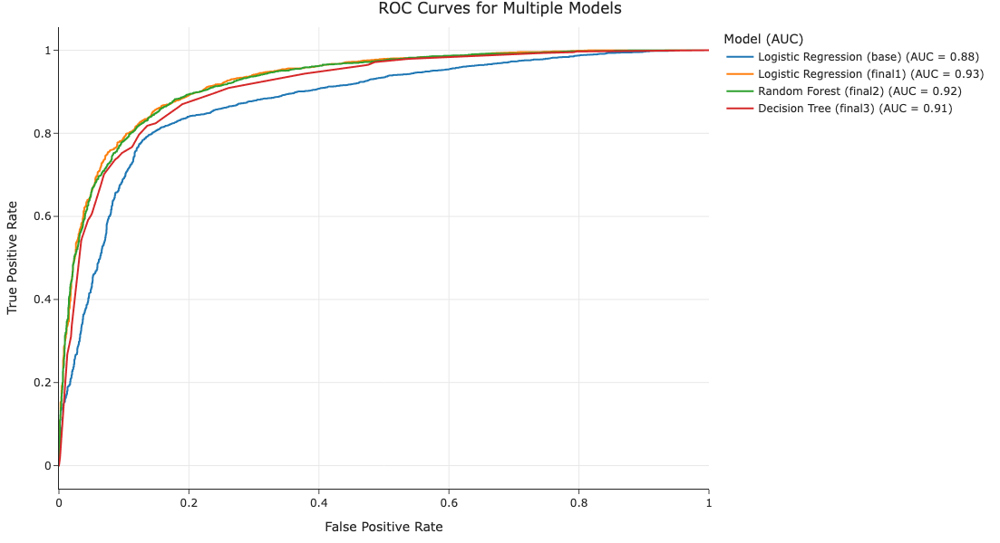

In [318]:
def draw_roc_curves(models, X_test, y_test):
    all_roc_data = []

    for label, model in models.items():
        probs = model.predict_proba(X_test)[:, 1]
        fprs, tprs, thresholds = roc_curve(y_test.to_numpy(), probs)
        roc_auc = auc(fprs, tprs)

        for fpr, tpr in zip(fprs, tprs):
            all_roc_data.append({
                'FPR': fpr,
                'TPR': tpr,
                'Model': f'{label} (AUC = {roc_auc:.2f})'
            })

    df_roc = pd.DataFrame(all_roc_data)

    fig = px.line(
        df_roc,
        x='FPR',
        y='TPR',
        color='Model',
        title='ROC Curves for Multiple Models',
        labels={'FPR': 'False Positive Rate', 'TPR': 'True Positive Rate'},
        width=1000,
        height=600
    )

    fig.write_html("roc_curves.html")
    fig.update_layout(legend_title='Model (AUC)')
    fig.show()

models = {
    'Logistic Regression (base)': base,
    'Logistic Regression (final1)': final1,
    'Random Forest (final2)': final2,
    'Decision Tree (final3)': final3,
}

draw_roc_curves(models, X_test, y_test)

### Confusion Matrices

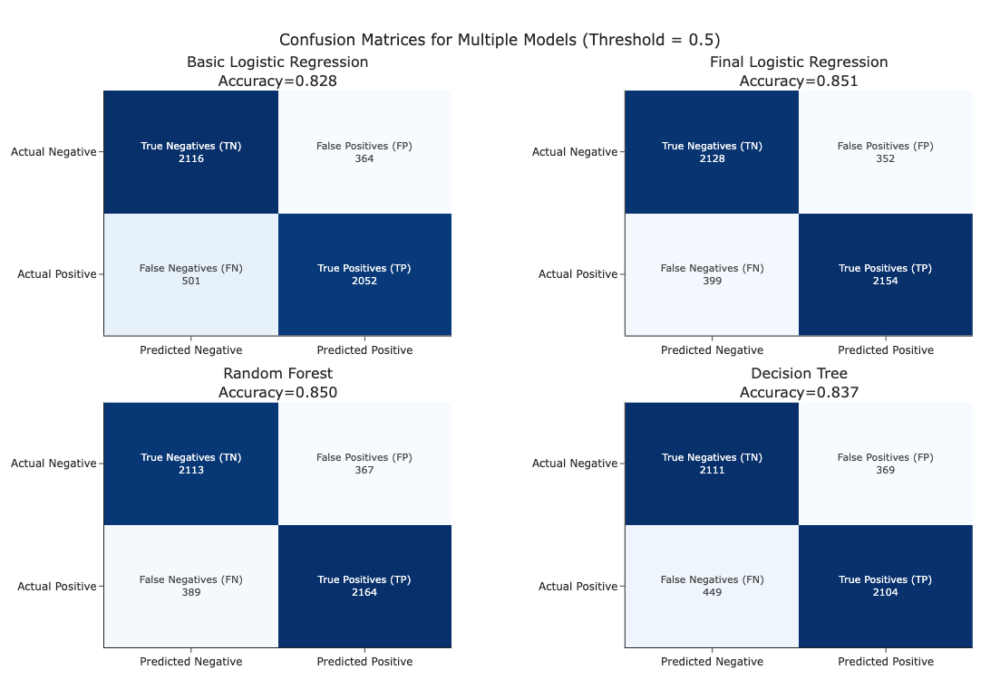

In [319]:
def predict_thresholded(model, X_test, T):
    probs = model.predict_proba(X_test)[:, 1]
    return (probs >= T).astype(int)

def get_confusion_heatmap(model, X_test, y_test, T, title):
    y_pred = predict_thresholded(model, X_test, T)
    cm = confusion_matrix(y_test, y_pred)
    acc = accuracy_score(y_test, y_pred)

    return go.Heatmap(
        z=cm,
        x=['Predicted Negative', 'Predicted Positive'],
        y=['Actual Negative', 'Actual Positive'],
        colorscale='Blues',
        text=[['True Negatives (TN)', 'False Positives (FP)'],
              ['False Negatives (FN)', 'True Positives (TP)']],
        texttemplate='%{text}<br>%{z}',
        textfont=dict(size=11),
        hovertemplate='Count: %{z}<br>Category: %{text}',
        showscale=False,
        name=title
    ), acc

def show_multiple_confusions(models, X_test, y_test, T=0.5):

    heatmaps = []
    accs = []
    for i, (name, model) in enumerate(models.items()):
        heatmap, acc = get_confusion_heatmap(model, X_test, y_test, T, title=name)
        heatmaps.append(heatmap)
        accs.append((name, acc))
    
    fig = make_subplots(
        rows=2, cols=2,
        subplot_titles=[f"{name}<br>Accuracy={acc:.3f}" for (name, acc) in accs],
        horizontal_spacing=0.2,
        vertical_spacing=0.12
    )

    for i, heatmap in enumerate(heatmaps):
        row = i // 2 + 1
        col = i % 2 + 1
        fig.add_trace(heatmap, row=row, col=col)

    fig.update_layout(
        width=800,
        height=750,
        title_text=f"Confusion Matrices for Multiple Models (Threshold = {T})",
        title_x=0.5,
        margin=dict(t=100)
    )
    fig.write_html("confusion_matrices.html")
    fig.update_yaxes(autorange='reversed')
    fig.show()

models = {
    'Basic Logistic Regression': base,
    'Final Logistic Regression': final1,
    'Random Forest': final2,
    'Decision Tree': final3
}

show_multiple_confusions(models, X_test, y_test, T=0.5)